# Data Mining: Harry Potter Sorting Hat
Studente: Aloisio Chiara Ludovica
Matricola: 239648
A/A: 2024/2025

---


# Setup
Come prima cosa, assicuriamoci che il seguente notebook funzioni sia con python 2 che 3, importiamo alcuni moduli di utilità e prepariamo le funzioni per salvare le immagini

In [37]:
# Python ≥3.5 is required
import sys
assert sys.version_info >= (3, 5)

# Scikit-Learn ≥0.20 is required
import sklearn
assert sklearn.__version__ >= "0.20"

# Common imports
import numpy as np
import os

#imports pandas
import pandas as pd
from IPython.display import Image
import os
#import warnings and Repress Warnings
import warnings
warnings.filterwarnings("ignore", message="numpy.dtype size changed")
warnings.filterwarnings("ignore", message="numpy.ufunc size changed")
warnings.filterwarnings("ignore", message="numpy.ndarray size changed")
warnings.filterwarnings('ignore')

# to make this notebook's output stable across runs
np.random.seed(42)

# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="whitegrid") #White Grid
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

# Where to save the figures
PROJECT_ROOT_DIR = "."
CHAPTER_ID= "Harry-Potter"
IMAGES_PATH = os.path.join(PROJECT_ROOT_DIR, "images")
os.makedirs(IMAGES_PATH, exist_ok=True)

def save_fig(fig_id, tight_layout=True, fig_extension="png", resolution=400):
    path = os.path.join(IMAGES_PATH, fig_id + "." + fig_extension)
    print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format=fig_extension, dpi=resolution)

def save_figure(figure, fig_id, tight_layout=False, fig_extension="png", resolution=400):
    path = os.path.join(IMAGES_PATH, fig_id + "." + fig_extension)
    print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    figure.savefig(path, format=fig_extension, dpi=resolution)

# Ignore useless warnings (see SciPy issue #5998)
import warnings
warnings.filterwarnings(action="ignore", message="^internal gelsd")
import warnings
warnings.filterwarnings('ignore')

# Hrule--> "====="
hrule = lambda x : "="*x
Hrule = lambda x,y: "="*(x//2)+y+"="*(x//2)

---

# Motivazione dello studio
Harry Potter è una serie di romanzi fantasy scritta da J.K. Rowling che segue le avventure di un giovane mago, Harry, mentre frequenta la Scuola di Magia e Stregoneria di Hogwarts e affronta il potente mago oscuro Lord Voldemort.

In [38]:
from IPython.display import Image
Image(url="https://cdn.wallpapersafari.com/39/28/s9IzxG.jpg", width=800)


Come sceglie le casate il Cappello Parlante?
Il Cappello Parlante è un cappello magico che smista gli studenti nelle quattro casate di Hogwarts: Grifondoro, Serpeverde, Corvonero e Tassorosso. Durante la Cerimonia di Smistamento, il cappello viene posto sulla testa dello studente e legge nella sua mente desideri, qualità e potenziale. In base a ciò che trova, decide la casata più adatta. Si basa principalmete su alcune caratteristiche più rilevanti quali, ad esempio l'eredità genetica dei genitori, il coraggio, l'inelligenza, la lealtà, l'ambizione, la conoscenza delle arti oscure, abilità el giocare a quidditch, abilità nei duelli e creatività.

In [39]:
from IPython.display import Image
Image(url="https://th.bing.com/th/id/OIP.gfkCacIGJu_4w9Q08F8G9gHaFu?rs=1&pid=ImgDetMain", width=800)


L'obiettivo del seguente studio sarà, dunque, dopo aver studiato il dataset, quello di predire la casata di uno studente della scuola di magia e stregoneria di Hogwarts attraverso modelli di multi classificazione.

---

# Pre processing
In questa prima parta andiamo a caricare i dati che verranno sottoposti a delle prime analisi di tipo strutturale che necesariamente porteranno all'individuazione di alcune trasformazioni necessarie per il proseguo delle analisi.

In [40]:
df = pd.read_csv("harry_potter_students_20000.csv")
pd.set_option('display.max_columns', None)
df.head
print(df.shape)

(20000, 10)


Vediamo le informazioni sul dataset

In [41]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 10 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Blood Status         15059 non-null  object 
 1   Bravery              15043 non-null  float64
 2   Intelligence         15019 non-null  float64
 3   Loyalty              15088 non-null  float64
 4   Ambition             15005 non-null  float64
 5   Dark Arts Knowledge  14964 non-null  float64
 6   Quidditch Skills     15089 non-null  float64
 7   Dueling Skills       15038 non-null  float64
 8   Creativity           14995 non-null  float64
 9   House                15049 non-null  object 
dtypes: float64(8), object(2)
memory usage: 1.5+ MB


Il comando `df.info()` mostra che il DataFrame ha 20.000 righe e 10 colonne. Otto colonne contengono dati numerici (`float64`) come Bravery, Intelligence, ecc., mentre due sono di tipo `object` (probabilmente stringhe), come Blood Status e House.
Tutte le colonne hanno valori mancanti, quindi sarà necessario gestire i `NaN`. La memoria usata è circa **1.5 MB**.
Iniziamo dunque i primi lavori di trasformazione del dataset, gestendo i valori NaN e eventuali duplicati al fine di aiutare la valutazione dei vari algoritmi.

# AGGIUNGERE NOMI E COGNOME PER OGNI RECORD

Iniziamo eliminand i duplicati

In [42]:
df.drop_duplicates(keep='first', inplace=True)
print(df.shape)

(7239, 10)


Andiamo ora a gestire i valori NaN:



In [43]:
df.isnull().sum()

Blood Status           378
Bravery                383
Intelligence           369
Loyalty                367
Ambition               391
Dark Arts Knowledge    378
Quidditch Skills       386
Dueling Skills         379
Creativity             379
House                  387
dtype: int64

Decido di voler predire i NaN usando il modello KNN imputer, ma prima devo effettuare alcune conversioni:


In [44]:
# One-Hot Encoding per "Blood Status"
df = pd.get_dummies(df, columns=['Blood Status'], drop_first=False)

print(df)


         Bravery  Intelligence    Loyalty   Ambition  Dark Arts Knowledge  \
0            NaN           NaN        NaN        NaN             7.000000   
1       3.000000      7.000000   6.000000   2.000000             5.000000   
2            NaN           NaN        NaN        NaN                  NaN   
3       2.000000      9.000000   1.000000   2.000000             3.000000   
4            NaN           NaN   9.000000   2.000000                  NaN   
6            NaN           NaN        NaN   2.000000                  NaN   
7       8.000000      2.000000   5.000000   3.000000             4.000000   
8       7.530624     45.834575  31.374254  36.640508             1.217457   
9       5.000000      4.000000   7.000000   5.000000             2.000000   
10      5.000000      5.000000   7.000000   3.000000             4.000000   
11      4.000000      7.000000   7.000000   3.000000             1.000000   
12     14.921990     17.921937  28.685400  56.354703            26.521810   

In [45]:
# One-Hot Encoding per "House"
df = pd.get_dummies(df, columns=['House'], drop_first=False)

print(df)


         Bravery  Intelligence    Loyalty   Ambition  Dark Arts Knowledge  \
0            NaN           NaN        NaN        NaN             7.000000   
1       3.000000      7.000000   6.000000   2.000000             5.000000   
2            NaN           NaN        NaN        NaN                  NaN   
3       2.000000      9.000000   1.000000   2.000000             3.000000   
4            NaN           NaN   9.000000   2.000000                  NaN   
6            NaN           NaN        NaN   2.000000                  NaN   
7       8.000000      2.000000   5.000000   3.000000             4.000000   
8       7.530624     45.834575  31.374254  36.640508             1.217457   
9       5.000000      4.000000   7.000000   5.000000             2.000000   
10      5.000000      5.000000   7.000000   3.000000             4.000000   
11      4.000000      7.000000   7.000000   3.000000             1.000000   
12     14.921990     17.921937  28.685400  56.354703            26.521810   

In [48]:
from sklearn.impute import KNNImputer
# Creiamo un oggetto KNNImputer
knn_imputer = KNNImputer(n_neighbors=2)  # 'n_neighbors' è il numero di vicini da considerare

# Applichiamo KNNImputer al DataFrame
df = pd.DataFrame(knn_imputer.fit_transform(df), columns=df.columns)

# Mostriamo il risultato
print(df)

        Bravery  Intelligence    Loyalty   Ambition  Dark Arts Knowledge  \
0      6.000000      7.000000   5.500000   6.000000             7.000000   
1      3.000000      7.000000   6.000000   2.000000             5.000000   
2      7.500000      2.000000   7.500000   4.500000             0.500000   
3      2.000000      9.000000   1.000000   2.000000             3.000000   
4      6.500000      3.500000   9.000000   2.000000             1.500000   
5      5.000000      8.500000   2.500000   2.000000             2.500000   
6      8.000000      2.000000   5.000000   3.000000             4.000000   
7      7.530624     45.834575  31.374254  36.640508             1.217457   
8      5.000000      4.000000   7.000000   5.000000             2.000000   
9      5.000000      5.000000   7.000000   3.000000             4.000000   
10     4.000000      7.000000   7.000000   3.000000             1.000000   
11    14.921990     17.921937  28.685400  56.354703            26.521810   
12    77.801

Ho sovrascritto il dataset con i miei valori aggiornati. Infatti:

In [49]:
df.isnull().sum()

Bravery                     0
Intelligence                0
Loyalty                     0
Ambition                    0
Dark Arts Knowledge         0
Quidditch Skills            0
Dueling Skills              0
Creativity                  0
Blood Status_Half-blood     0
Blood Status_Muggle-born    0
Blood Status_Pure-blood     0
House_Gryffindor            0
House_Hufflepuff            0
House_Ravenclaw             0
House_Slytherin             0
dtype: int64

ora effettivamente non ho più valori null.

Andiamo dunque a normalizzare tutti i valori. Scelgo la normalizzazione Min-Max Scaling perchè ho bisogno che i miei valori esistano in un range strettamente definito. Prima, per un eccesso di zelo, voglio controllare la non presenza di outliers:

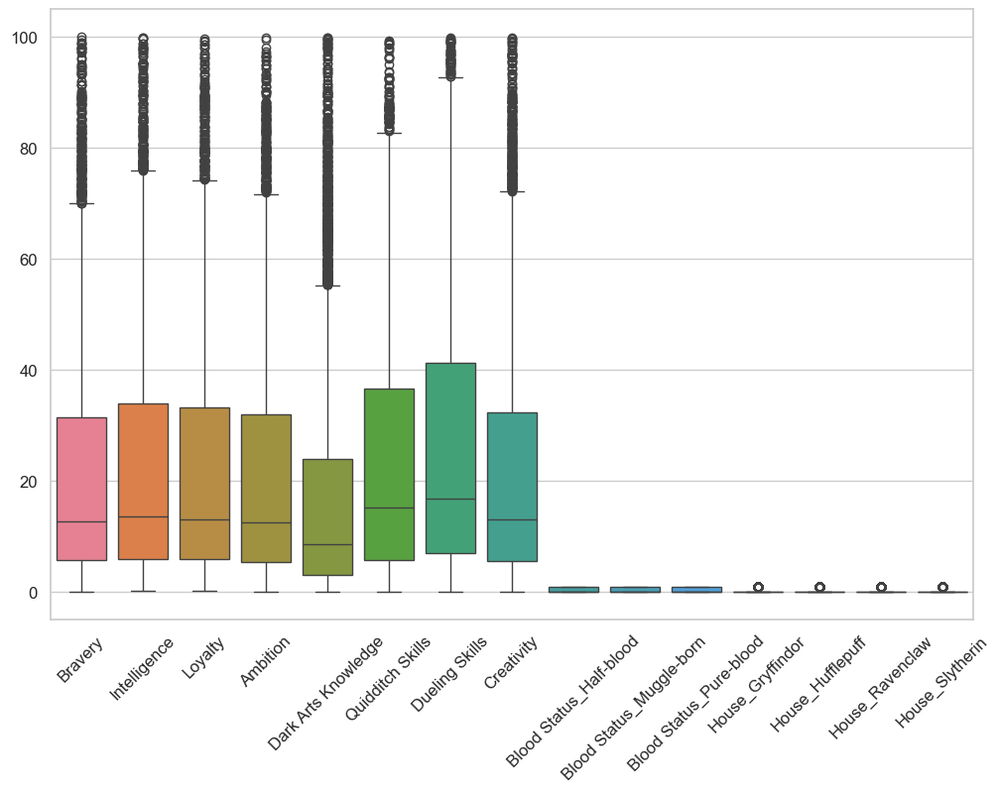

In [55]:
numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns

# Creare un boxplot per ogni colonna numerica
plt.figure(figsize=(12, 8))  # Impostiamo una dimensione per il grafico
sns.boxplot(data=df[numeric_columns])

# Mostrare il grafico
plt.xticks(rotation=45)  # Ruotiamo le etichette se necessario
plt.show()

Contro ogni aspettativa, ho molti outliers, dunque eseguo standardizzaione tramite Z-Score

In [57]:
from sklearn.preprocessing import StandardScaler

# Creiamo un oggetto StandardScaler
scaler = StandardScaler()

# Applichiamo la standardizzazione
df_standardized = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

# Mostriamo il risultato
print(df_standardized)

       Bravery  Intelligence   Loyalty  Ambition  Dark Arts Knowledge  \
0    -0.729561     -0.713551 -0.774430 -0.728627            -0.487218   
1    -0.875603     -0.713551 -0.750333 -0.921890            -0.588067   
2    -0.656540     -0.948988 -0.678043 -0.801101            -0.814979   
3    -0.924284     -0.619376 -0.991299 -0.921890            -0.688917   
4    -0.705220     -0.878357 -0.605754 -0.921890            -0.764554   
5    -0.778241     -0.642920 -0.919010 -0.921890            -0.714129   
6    -0.632199     -0.948988 -0.798527 -0.873574            -0.638492   
7    -0.655049      1.115067  0.472534  0.751794            -0.778801   
8    -0.778241     -0.854813 -0.702140 -0.776943            -0.739342   
9    -0.778241     -0.807726 -0.702140 -0.873574            -0.638492   
10   -0.826922     -0.713551 -0.702140 -0.873574            -0.789766   
11   -0.295231     -0.199266  0.342949  1.704301             0.497166   
12    2.765773      0.773252 -0.355895 -0.179818   

---

# Visualizazion


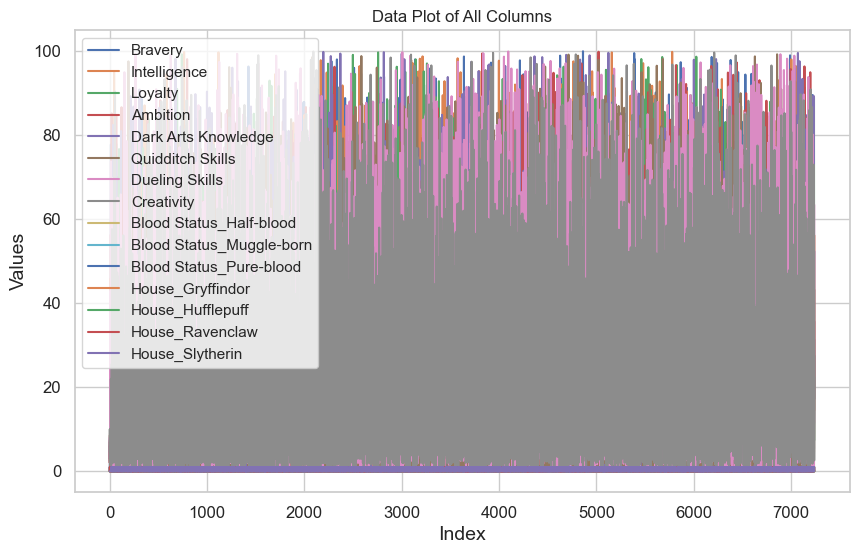

In [59]:
import matplotlib.pyplot as plt

# Plottare ogni colonna numerica nel dataset
df.plot(figsize=(10, 6))  # Impostiamo una dimensione per il grafico

# Mostrare il grafico
plt.title('Data Plot of All Columns')
plt.xlabel('Index')
plt.ylabel('Values')
plt.show()


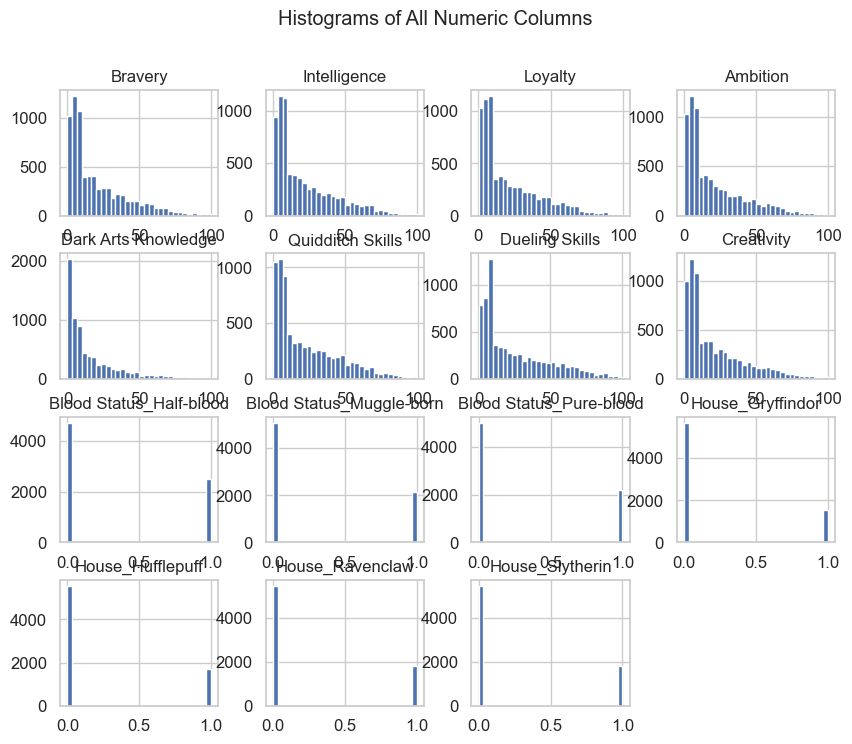

In [60]:
# Creiamo un istogramma per ogni colonna numerica
df.hist(figsize=(10, 8), bins=30)  # Impostiamo una dimensione e il numero di bin

# Mostriamo il grafico
plt.suptitle('Histograms of All Columns')
plt.show()


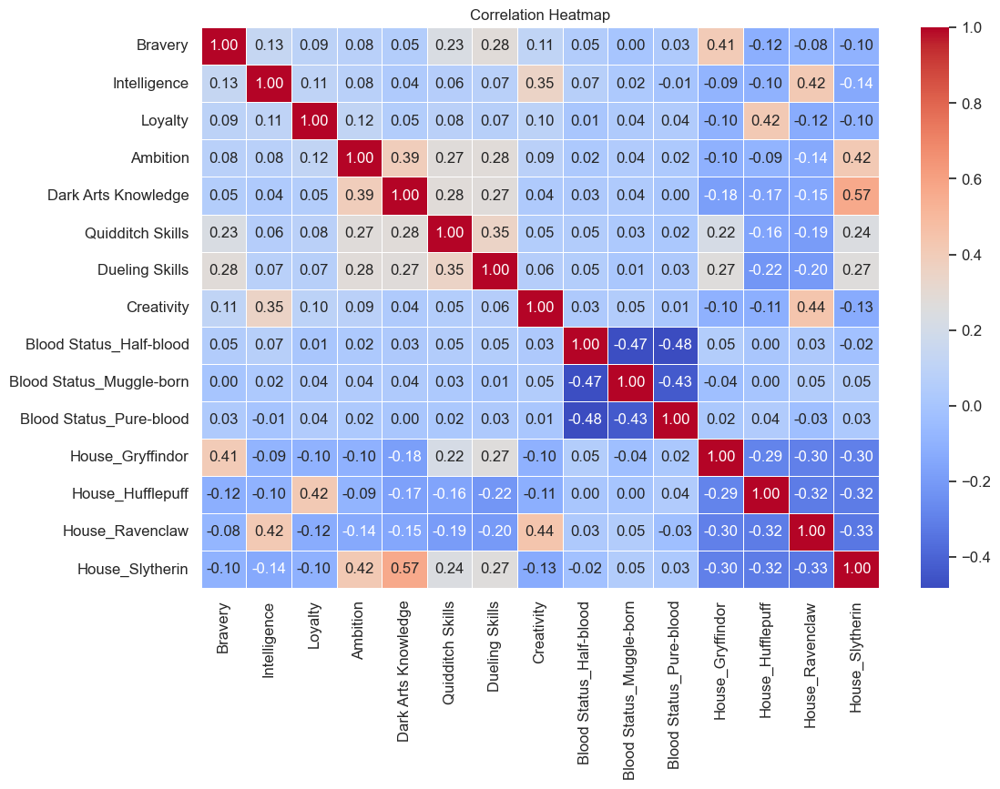

In [61]:
import seaborn as sns

# Calcolare la matrice di correlazione
corr_matrix = df.corr()

# Creare una heatmap della matrice di correlazione
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)

# Mostrare il grafico
plt.title('Correlation Heatmap')
plt.show()


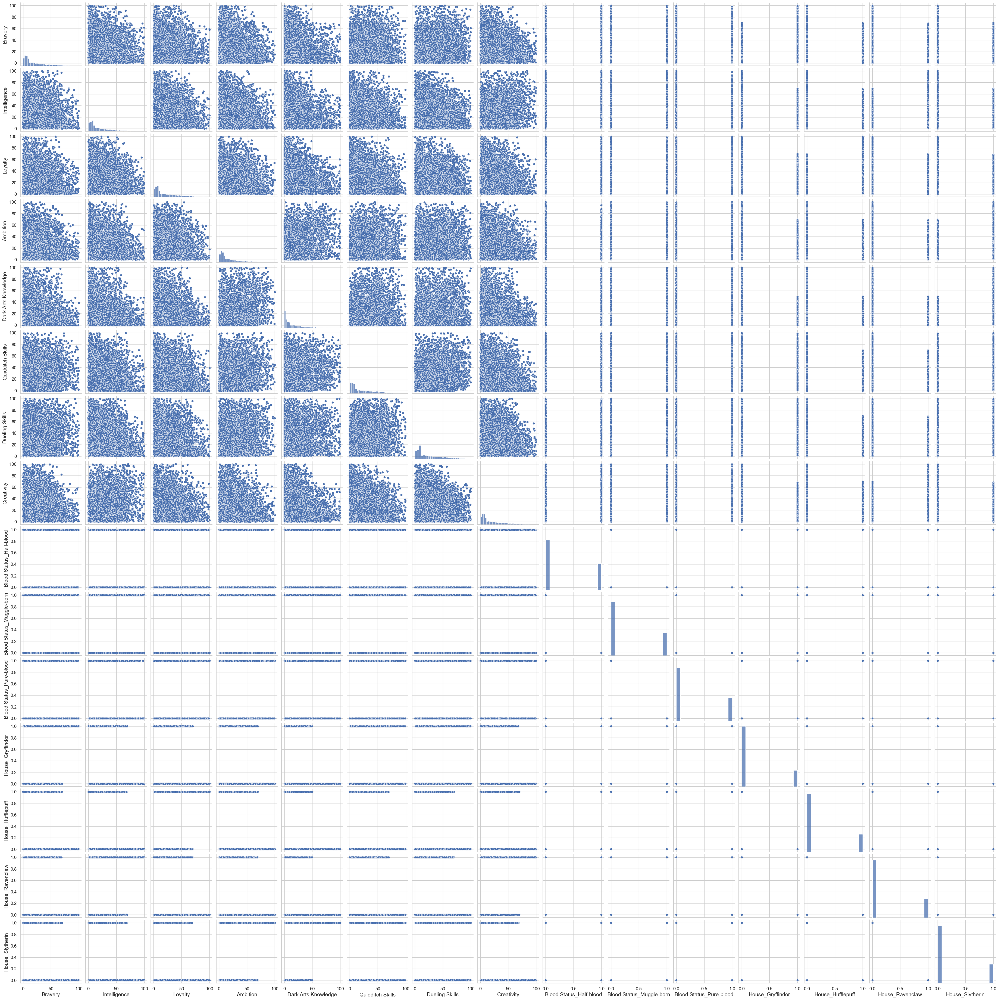

In [62]:
import seaborn as sns

# Pairplot del dataset (mostra scatter plot e distribuzioni per ogni variabile)
sns.pairplot(df)

# Mostrare il grafico
plt.show()


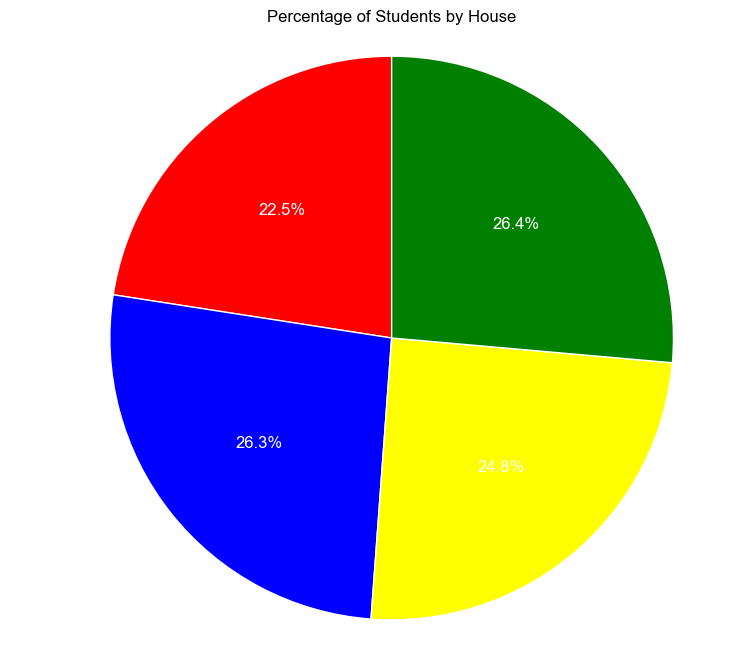

In [65]:
# Sommare i valori di ciascuna colonna per ottenere il numero di studenti per ogni casata
house_counts = df[['House_Gryffindor', 'House_Ravenclaw', 'House_Hufflepuff', 'House_Slytherin']].sum()

# Definire i colori per ciascuna casata
colors = ['red', 'blue', 'yellow', 'green']  # rosso per Gryffindor, blu per Ravenclaw, giallo per Hufflepuff, verde per Slytherin

# Creare il grafico a torta
plt.figure(figsize=(8, 8))
plt.pie(house_counts, labels=house_counts.index, autopct='%1.1f%%', startangle=90, colors=colors, textprops={'color': 'white'})

# Aggiungere un titolo
plt.title('Percentage of Students by House', color='black')

# Mostrare il grafico
plt.axis('equal')  # Assicurarsi che il grafico sia circolare
plt.show()



---

# non so che cazzo fare ora :)